In [3]:
import numpy as np
import pandas as pd
import matplotlib as mp
import matplotlib.pyplot as plt
from scipy.io import loadmat
from sklearn import cluster
from scipy.cluster import hierarchy
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import MDS, LocallyLinearEmbedding, Isomap

In [21]:
def grayplt(img):
    side = int(np.sqrt(len(img)))
    if len(img.shape) == 1:
        img = img.reshape(side, side)
    #plt.imshow(np.rot90(img,k=3), cmap='gray')
    plt.imshow(img, cmap='gray')
    
def plot_embedding(y, embedding, exclude=[]):
    print len(y)
    for digit, new_point in zip(y, embedding):
        #plt.plot(new_point[0], new_point[1], 'C'+str(digit)+'o')
        digit = digit[0]
        if not digit in exclude:
            plt.plot(new_point[0], new_point[1], 'wo')
            plt.text(new_point[0], new_point[1], str(digit), color='C'+str(digit%9))
    plt.show()
    
def fit_model(X, model):
    fit = model.fit(X)
    embedding = fit.transform(X)
    return embedding, fit

In [46]:
emnist_file = './emnist/emnist-letters-train.csv'
lettersdf = pd.read_csv(emnist_file, header=None, nrows=2000)
lettersT = lettersdf.transpose()
y = lettersT.as_matrix()[0]
Xt = lettersT[1:].as_matrix()
X = lettersdf.drop([0],axis=1).as_matrix()

In [179]:
#temnist_file = './emnist/emnist-mnist-test.csv'
temnist_file = emnist_file
tlettersdf = pd.read_csv(temnist_file, header=None, nrows=10000)
tlettersT = tlettersdf.transpose()
ty = tlettersT.as_matrix()[0]
tXt = tlettersT[1:].as_matrix()
tX = tlettersdf.drop([0],axis=1).as_matrix()

In [ ]:
model = cluster.AgglomerativeClustering(linkage='average')
fit = model.fit(X)
#clusters = model.predict(X)

In [ ]:
h_clusters = hierarchy.linkage(X, method="single", metric="euclidean")
d = hierarchy.dendrogram(h_clusters)
#clusters = hierarchy.fcluster(h_clusters, t=6.5)
plt.show()

In [ ]:
model = KMeans(10)
fit = model.fit(X)

In [ ]:
c = fit.cluster_centers_
l = fit.labels_

In [ ]:
purity = {}
for true, assign in zip(y, l):
    if not assign in purity:
        purity[assign] = {}
    purity[assign][true] = purity[assign].get(true, 0) + 1

In [ ]:
purity[0]

In [85]:
def get_centroids(X, y):
    N = len(X)
    means = {0:np.zeros(X[0].shape)}
    for i, pic in enumerate(X):
        means[y[i]] = np.add(means.get(y[i], np.zeros(X[0].shape)), pic)
    return means

centroids = get_centroids(X, y)

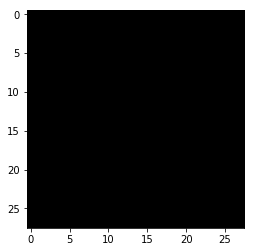

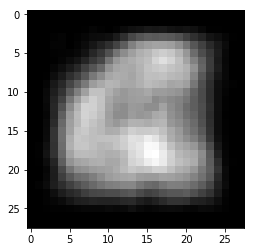

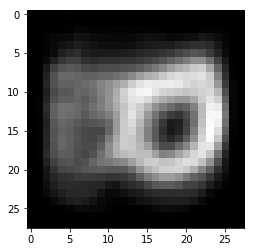

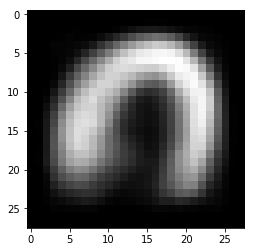

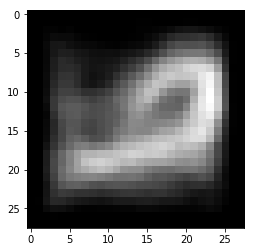

...

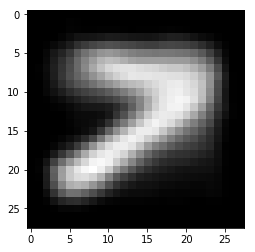

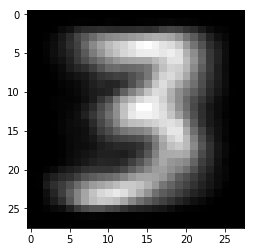

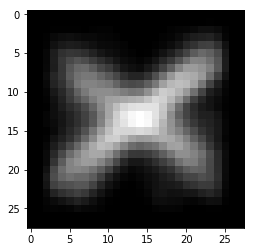

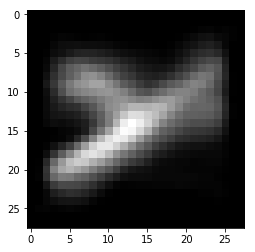

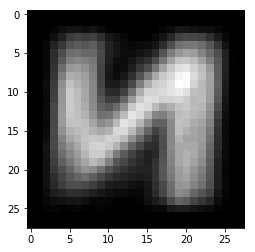

<Figure size 432x288 with 0 Axes>

In [86]:
for i in range(27):
    grayplt(centroids[i])
    plt.figure()

In [51]:
def data_by_class(X, y):
    dbc = {}
    for i, x in enumerate(X):
        if not y[i] in dbc:
            dbc[y[i]] = []
        dbc[y[i]].append(x)
    return dbc

dbc = data_by_class(X, y)

In [58]:
def cluster_each_class(data_by_class):
    dbc = data_by_class
    clusters_by_class = {}
    for cls in dbc:#class in dbc
        f = KMeans(20)
        f.fit(dbc[cls])
        clusters_by_class[cls] = f.cluster_centers_
    return clusters_by_class
    

cbc = cluster_each_class(dbc)

In [94]:
def tidy_cbc(clusters_by_class):
    cbc = clusters_by_class
    class_clusters = [[],[]]
    for cls in cbc:
        for centroid in cbc[cls]:
            class_clusters[0].append(centroid)
            class_clusters[1].append(cls)
            
    return class_clusters

tcbc = tidy_cbc(cbc)

In [209]:
def get_proto_distances(protos, observation):
    return map(lambda c:np.linalg.norm(c-observation), protos)

#get_proto_distances(tcbc[0], X[6])

[2687.8903902503166,
 2415.184895613584,
 2680.2092113614312,
 3210.7352351136024,
 2941.3947230296494,
 2748.228349773723,
 3088.4729416187397,
 2671.8169379656233,
 1652.5039936349904,
 3057.236824323559,
 2629.336323105129,
 3134.888997680425,
 2316.1334664841534,
 2944.0435203984334,
 2740.9399289071534,
 2393.032960491769,
 2653.2701520953347,
 2996.061117905011,
 3058.6217893031494,
 2454.8516814214618,
 2570.3288213767514,
 2729.7994317348666,
 2689.5609926776774,
 2999.911591289909,
 3151.147053058616,
 2911.1679786642335,
 3027.263636520612,
 2902.1541424718753,
 2486.493791466208,
 2967.6184241089877,
 3174.83420826978,
 2612.290444676269,
 2536.6188688319507,
 3073.4343786715212,
 2842.237103058082,
 3170.6705521072354,
 2993.4794136589617,
 2644.6198716084173,
 2426.8030410397955,
 2713.0361403352945,
 2623.7263270978115,
 2735.4272023930444,
 2800.38053961719,
 2821.8283859937337,
 2940.9121510170958,
 2888.6110849333804,
 2558.6093512883126,
 3011.759678223845,
 3027.7598

In [207]:
def proto_classify(centroids_classes):
    def generated_proto_classify(observation):
        cc = centroids_classes
        norms = get_proto_distances(cc[0], observation)
        return cc[1][np.argmin(norms)]
    return generated_proto_classify

alph = 'aabcdefghijklmnopqrstuvwxyz'
i=2500
pclf = proto_classify(centroids)
assign = pclf(tX[i])
print alph[assign]
print alph[ty[i]]
grayplt(tX[i])

TypeError: string indices must be integers, not numpy.float64

In [180]:
def score(predict, X, y):
    tally = 0.0
    for i, x in enumerate(X):
        assign = predict(x)
        if assign == y[i]:
            tally += 1
    return tally/len(y)

score(pclf, tX, ty)

0.7289

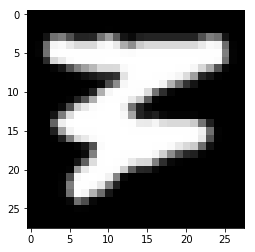

In [120]:
grayplt(X[0])

In [ ]:
ccs = f.cluster_centers_
em, f = fit_model(ccs, MDS())

In [ ]:
plot_embedding(np.zeros((1,27)).transpose().astype(int), em)

In [49]:
rfc = RandomForestClassifier()
rfc.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [50]:
print rfc.score(X, y)
print rfc.score(tX, ty)

0.996
0.6579


In [193]:
res = rfc.predict(tX)

In [198]:
s = res == ty

In [204]:
s = list(s)

In [208]:
rfc = RandomForestClassifier()
rfc.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [213]:
map(lambda o: get_proto_distances(tcbc[0], o), X)

[[3111.2971169594202,
  2977.7603127182683,
  2722.577654233821,
  3647.650716557165,
  2913.079570374509,
  2880.832182286917,
  2760.1323237200863,
  3361.0628899203894,
  2991.2090279650456,
  3323.7366020790514,
  2660.968902486461,
  2749.4461917104527,
  2704.8353022588412,
  3061.086612626307,
  2748.379310927568,
  3343.9545077647213,
  2734.1954026733347,
  2649.394186518034,
  3173.117434007131,
  2741.118769975338,
  3310.1932345408477,
  3224.5253817422495,
  3579.900696946774,
  3782.4913600547575,
  2936.316527556251,
  2596.6208810683165,
  3351.147732494048,
  3062.930622785962,
  3139.240572973024,
  3463.0651805076445,
  3461.6461763155403,
  3429.6306250804614,
  3048.9717939003635,
  2948.8503658205514,
  2934.5798251197734,
  3569.691688367498,
  3630.3108682315346,
  3376.3718028410926,
  3416.1358286812892,
  3312.127276957429,
  2945.377292480834,
  2755.890985225827,
  3188.6985067056225,
  3413.3675219641964,
  3385.7074120484776,
  3467.222807954516,
  2996.9